<center>
<img src="https://habrastorage.org/webt/jq/gc/r5/jqgcr5azmatev6zvgufn8xftehy.png">
    
##  II Escuela de Verano en Física Computacional

Autor: [Gerardo Rivera](https://github.com/DangoMelon).\
Institución: Instituto Geofísico del Perú / UNMSM\
Correo: gerardo.rivera1@unmsm.edu.pe
    
Este material está sujeto a los términos y condiciones de la licencia [Creative Commons CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0/). Se permite el uso gratuito para cualquier propósito no comercial.

*También puede consultar la última versión de este notebook en nuestro [repositorio](https://github.com/PCPUNMSM) y los videos de clase [en nuestro canal de Youtube](https://www.youtube.com/channel/UCze8vzQLcplutz0nWDNjFCA).*
    

# <center> Sesión 13. Manejo de datos n-dimensionales en python: *conociendo xarray*  

<br>
<div align="center">
    <img src="http://xarray.pydata.org/en/stable/_static/dataset-diagram-logo.png" width=30%>
</div>
<br>

## Outline
1. [Conociendo xarray](#1.-Conociendo-xarray)
2. [Funciones Básicas](#2.-Funciones-básicas)
3. [Trabajando con datos](#3.-Trabajando-con-datos)
4. [Gráficos](#4.-Gráficos)
5. [Integración con dask](#5.-Integración-con-dask)
6. [Aplicación con datos reales](#6.-Aplicación-con-datos-reales)
7. [Aplicación Numérica](#7.-Aplicación-Numérica)

## 1. Conociendo xarray

Para trabajar con data cubes usando python haremos uso extensivo de los paquetes estrella de la plataforma Pangeo. Pangeo es un esfuerzo de la comunidad que promueve la reproductibilidad, escalamiento y transparencia en la ciencia.

El paquete de cabecera para el manejo de dichas estructuras de datos será xarray. Xarray extiende las capacidades de numpy en el manejo de datos n-dimensionales introduciendo etiquetas en forma de dimensiones, coordenadas y atributos que facilitan las operaciones sobre los mismos. El motor para las operaciones usando las etiquetas es proporcionado por pandas; la capacidad de manejar datos n-dimensionales con facilidad es propocionado por numpy; y la escalabilidad de los datos es proporcionado por dask, convirtiendo a este paquete en una herramienta poderosa.

In [1]:
# Quitar el comentario y correr esta línea si se esta usando google colab
#!pip install -q -U git+https://github.com/pydata/xarray.git#egg=xarray[complete]

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

### 1.1. Estructuras de xarray

`xarray` cuenta con dos estructuras simples que son fundamentales comprender para un mejor uso del paquete. Esta es una brevisima descripción sobre algunos conceptos claves que se deben tener presentes, mayor informacion la pueden encontrar siempre en la [documentacion](http://xarray.pydata.org/en/stable/data-structures.html)

#### 1.1.1. `DataArray`

Un `DataArray` es virtualmente igual a un arreglo n-dimensional de numpy que cuenta con etiquetas en sus dimensiones, siendo este la estructura de datos base de xarray. Para denifinir un DataArray necesitaremos proporcionar, como mínimo, una arreglo de elementos, como los generados por `numpy`.

In [3]:
xr.DataArray(np.random.randn(10, 5))

<xarray.DataArray (dim_0: 10, dim_1: 5)>
array([[-0.31349736,  0.11246682,  0.45119803,  0.02961037, -0.38997421],
       [-1.32424662, -0.67310079, -0.46406006,  0.16100064, -0.63107223],
       [ 1.0715632 , -0.21387077, -0.5982754 ,  0.02306261,  0.32420762],
       [ 1.22716361,  0.77790921,  0.8147834 ,  0.15013691, -0.95353248],
       [-0.86575588,  1.58595418, -0.02426288, -1.68439801,  0.02796785],
       [-0.42584461,  0.15719248, -0.73412147,  1.83455074,  1.26987305],
       [-0.15247053,  0.24063451, -0.33653665,  0.36365247,  2.91656162],
       [-0.34697628, -1.17972848,  0.51413759, -0.33893416, -1.03504416],
       [ 0.44824544,  0.63469593,  1.26191476, -1.20167617,  0.14619118],
       [ 0.97289385, -1.55313598, -0.6557977 ,  0.50950294,  1.64613467]])
Dimensions without coordinates: dim_0, dim_1

El `repr` en html de xarray es bien practico cuando estamos trabajando en notebooks, sin embargo, el `repr` en puro texto contiene un poco de información adicional sobre el estado de las coordenadas en el `DataArray` recién creado

In [4]:
with xr.set_options(display_style="text"):
    display(xr.DataArray(np.random.randn(10, 5)))

<xarray.DataArray (dim_0: 10, dim_1: 5)>
array([[-0.83971258, -0.04736618,  0.04309496,  1.24380046,  0.39592776],
       [-1.91427352,  0.80276449,  0.15952776,  0.8769603 ,  0.1907572 ],
       [-0.08016087,  0.21454249, -1.07823464, -0.33785163, -0.50692469],
       [ 0.03034765,  1.39259928, -1.19526197, -0.7006947 ,  0.35523306],
       [ 0.12375331, -1.19933991, -2.47806552,  0.52017603, -0.75586308],
       [ 1.08435521,  0.36647899, -0.3830864 , -0.74285952,  1.20225566],
       [ 1.29139117, -0.51191609, -0.74038846, -1.04005284, -1.70203773],
       [-0.64823284, -0.36352084, -2.08167364, -1.04154843, -1.53836921],
       [ 0.06751052, -0.57729537,  0.38117899,  1.17493278, -0.6541077 ],
       [-0.10837015, -0.66961829,  0.36476411, -1.59378253, -0.87215913]])
Dimensions without coordinates: dim_0, dim_1

In [8]:
np.random.randn(10,4,9,2).shape

(10, 4, 9, 2)

De manera automática, nuestras dimensiones fueron asignadas con nombres genéricos ya que no agregamos ningun detalle adicional. Adicionalmente, en el `repr` de texto podemos observar un mensaje adicional sobre `Dimensions without coordinates`, esto se debe a que no tenemos ninguna coordenada definida para nuestras dimensiones. Las coordenadas pueden ser entendidas como etiquetas a cada elemento posicional en una dimensión.  

Ahora crearemos un `DataArray` con la información que hace falta

In [9]:
# Creamos las coordenadas para nuestras dimensiones
lat = np.arange(-90, 90, 0.25)
lon = np.arange(0, 360, 0.25)

# Creamos un poco de data falsa
llon, llat = np.meshgrid(lon, lat)
r = np.sqrt(llon ** 2 + llat ** 2)
data = np.sin(r)

# Creamos el DataArray
xarr = xr.DataArray(data, coords=[lat, lon], dims=["lat", "lon"], name="false_data")
xarr

<xarray.DataArray 'false_data' (lat: 720, lon: 1440)>
array([[ 0.89399666,  0.89384103,  0.89337348, ..., -0.34851755,
        -0.11323483,  0.12868468],
       [ 0.97705966,  0.97698545,  0.9767621 , ..., -0.40471088,
        -0.17323376,  0.06839483],
       [ 0.99937382,  0.99938611,  0.99942226, ..., -0.45927369,
        -0.23244156,  0.00801263],
       ...,
       [ 0.95955175,  0.95965027,  0.95994511, ..., -0.51201861,
        -0.29064754, -0.05224028],
       [ 0.99937382,  0.99938611,  0.99942226, ..., -0.45927369,
        -0.23244156,  0.00801263],
       [ 0.97705966,  0.97698545,  0.9767621 , ..., -0.40471088,
        -0.17323376,  0.06839483]])
Coordinates:
  * lat      (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.0 89.25 89.5 89.75
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8

In [10]:
xarr.sel(lat=-89.5)

<xarray.DataArray 'false_data' (lon: 1440)>
array([ 0.99937382,  0.99938611,  0.99942226, ..., -0.45927369,
       -0.23244156,  0.00801263])
Coordinates:
    lat      float64 -89.5
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8

Nuestro `DataArray` ha sido creado dentro de la variable xarr con las dimensiones y coordenadas asignadas correctamente. Ahora podemos acceder a los métodos que xarray ofrece para sus objetos.

In [19]:
xarr.lat.attrs["long_name"] = "Latitud"
xarr.lat.attrs["units"] = "degrees_north"

In [25]:
xarr.attrs["units"] = "K"
xarr.attrs["long_name"] = "Temperature"

In [26]:
xarr

<xarray.DataArray 'false_data' (lat: 720, lon: 1440)>
array([[ 0.89399666,  0.89384103,  0.89337348, ..., -0.34851755,
        -0.11323483,  0.12868468],
       [ 0.97705966,  0.97698545,  0.9767621 , ..., -0.40471088,
        -0.17323376,  0.06839483],
       [ 0.99937382,  0.99938611,  0.99942226, ..., -0.45927369,
        -0.23244156,  0.00801263],
       ...,
       [ 0.95955175,  0.95965027,  0.95994511, ..., -0.51201861,
        -0.29064754, -0.05224028],
       [ 0.99937382,  0.99938611,  0.99942226, ..., -0.45927369,
        -0.23244156,  0.00801263],
       [ 0.97705966,  0.97698545,  0.9767621 , ..., -0.40471088,
        -0.17323376,  0.06839483]])
Coordinates:
  * lat      (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.0 89.25 89.5 89.75
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
Attributes:
    units:      K
    long_name:  Temperature

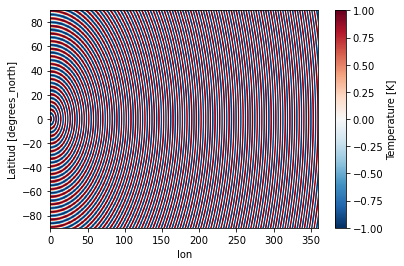

In [27]:
xarr.plot()

Existen varias formas convenientes de crear un `DataArray` que son practicas en algunos casos

In [28]:
np.zeros_like(np.random.rand(20,10))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [32]:
xr.full_like(xarr, np.inf)

<xarray.DataArray 'false_data' (lat: 720, lon: 1440)>
array([[inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       ...,
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf]])
Coordinates:
  * lat      (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.0 89.25 89.5 89.75
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
Attributes:
    units:      K
    long_name:  Temperature

In [29]:
xr.zeros_like(xarr)

<xarray.DataArray 'false_data' (lat: 720, lon: 1440)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])
Coordinates:
  * lat      (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.0 89.25 89.5 89.75
  * lon      (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
Attributes:
    units:      K
    long_name:  Temperature

**Ejercicio**

Crear un `DataArray` llamado "temperatura" a partir de datos aleatorios.

- Debe tener tres coordenadas con nombres "latitud", "longitud" y "profundidad"
- Debe tener atributos en cada coordenada asi como atributos generales

In [36]:
lat = np.arange(-10,10,0.5)
lon = np.arange(-120, 100)
prof = np.arange(0, 100, 5)
data = np.random.rand(lat.size, lon.size, prof.size)

xtemp = xr.DataArray(data, coords=[lat, lon, prof], dims=["lat", "lon", "prof"], name="temperatura")
xtemp.attrs["name"] = "Temperatura"
xtemp.lat.attrs["name"] = "Latitud"
xtemp.lon.attrs["name"] = "Longitud"
xtemp.prof.attrs["name"] = "Profundidad"

xtemp

<xarray.DataArray 'temperatura' (lat: 40, lon: 220, prof: 20)>
array([[[0.90211201, 0.27674968, 0.16751075, ..., 0.91044205,
         0.81559133, 0.49013136],
        [0.75866342, 0.08771675, 0.81241605, ..., 0.43241436,
         0.70542761, 0.63907339],
        [0.42011392, 0.95547289, 0.03111356, ..., 0.17074488,
         0.8219727 , 0.51257051],
        ...,
        [0.92664087, 0.0909516 , 0.98756223, ..., 0.21571789,
         0.147161  , 0.48763191],
        [0.35529216, 0.47731503, 0.13796316, ..., 0.06785814,
         0.38626074, 0.92880732],
        [0.74044218, 0.17760363, 0.73397247, ..., 0.79324056,
         0.63188112, 0.12538953]],

       [[0.89311819, 0.45610793, 0.09715747, ..., 0.34742793,
         0.75158767, 0.59976248],
        [0.91237464, 0.67663772, 0.90206596, ..., 0.79040537,
         0.68899373, 0.20691538],
        [0.31265162, 0.63641662, 0.28421091, ..., 0.73309544,
         0.45374086, 0.72310216],
...
        [0.59781968, 0.44790011, 0.35778525, ..., 0.73436448,
         0.47933314, 0.25358871],
        [0.19814937, 0.85445687, 0.52365837, ..., 0.55398674,
         0.78160504, 0.00577629],
        [0.14940633, 0.56944326, 0.32237022, ..., 0.36317977,
         0.89123819, 0.98822771]],

       [[0.03627642, 0.43643196, 0.81773525, ..., 0.68012434,
         0.58343026, 0.65181009],
        [0.45280811, 0.62372353, 0.18335858, ..., 0.02839569,
         0.86666522, 0.60113782],
        [0.55832048, 0.97683324, 0.74241315, ..., 0.27355979,
         0.38418599, 0.14899682],
        ...,
        [0.83746011, 0.98569979, 0.17917119, ..., 0.08066572,
         0.91896134, 0.08108385],
        [0.56807607, 0.6136335 , 0.98163696, ..., 0.9852675 ,
         0.95827763, 0.57837649],
        [0.75327533, 0.02091813, 0.40440553, ..., 0.6630789 ,
         0.04797527, 0.63479815]]])
Coordinates:
  * lat      (lat) float64 -10.0 -9.5 -9.0 -8.5 -8.0 ... 7.5 8.0 8.5 9.0 9.5
  * lon      (lon) int64 -120 -119 -118 -117 -116 -115 ... 94 95 96 97 98 99
  * prof     (prof) int64 0 5 10 15 20 25 30 35 40 ... 60 65 70 75 80 85 90 95
Attributes:
    name:     Temperatura

#### 1.1.2. `Dataset`

Un `Dataset` es la representación en la memoria del sistema de un archivo netcdf. Al igual que en pandas un `DataFrame` es un conjunto de `Series`, en xarray un `Dataset` es un conjunto de `DataArray`'s. Su declaración es un poco más extensa que un `DataArray` pero a cambio proporciona un contenedor a varias variables.

<div align="center">
<img src="http://xarray.pydata.org/en/stable/_images/dataset-diagram.png" width=80%>
<br>
<a href="http://xarray.pydata.org/en/stable/data-structures.html#dataset">Documentación de Dataset</a>
</div>

In [37]:
# Definimos las coordenadas para nuestras dimensiones
# en este caso tendremos 3 dimensiones: latitud, longitud y tiempo
lat = np.arange(-15, 15, 0.25)
lon = np.arange(140, 280, 0.25)
time = pd.date_range("2019-01-01", freq="D", periods=120)

# Datos aleatorios
temp = np.random.rand(120, len(lat), len(lon))
precip = np.random.rand(120, len(lat), len(lon))
elev = np.random.rand(len(lat), len(lon))
serie = np.random.rand(len(time))

In [38]:
# Declaramos el Dataset
ds = xr.Dataset(
    {
        "temp": (["time", "lat", "lon"], temp),
        "precip": (["time", "lat", "lon"], precip),
        "elev": (["lat", "lon"], elev),
        "serie": (["time"], serie),
    },
    coords={"time": time, "lat": lat, "lon": lon},
)
ds

<xarray.Dataset>
Dimensions:  (lat: 120, lon: 560, time: 120)
Coordinates:
  * time     (time) datetime64[ns] 2019-01-01 2019-01-02 ... 2019-04-30
  * lat      (lat) float64 -15.0 -14.75 -14.5 -14.25 ... 14.0 14.25 14.5 14.75
  * lon      (lon) float64 140.0 140.2 140.5 140.8 ... 279.0 279.2 279.5 279.8
Data variables:
    temp     (time, lat, lon) float64 0.3763 0.04268 0.09992 ... 0.4476 0.1056
    precip   (time, lat, lon) float64 0.4328 0.9464 0.1099 ... 0.7124 0.2213
    elev     (lat, lon) float64 0.9818 0.8489 0.7752 ... 0.0162 0.2161 0.7193
    serie    (time) float64 0.094 0.7635 0.5495 0.2192 ... 0.9365 0.7979 0.4945

Si la terminología es un poco dificil de entender, siempre pueden consultar la [documentación](http://xarray.pydata.org/en/stable/terminology.html0)

### 1.2. Seleccion de datos

`xarray` cuenta con dos métodos para selección de datos: `sel` y `isel`

`sel` funciona usando los nombres (o etiquetas) asignados a cada dimension

In [39]:
ds = xr.tutorial.load_dataset("air_temperature")
air = ds.air

In [40]:
air.sel(time="2013-04-01")

<xarray.DataArray 'air' (time: 4, lat: 25, lon: 53)>
array([[[253.79999, 254.39   , 254.5    , ..., 241.29999, 242.29999,
         243.79999],
        [253.59999, 254.89   , 255.59999, ..., 242.09999, 241.59999,
         242.29999],
        [255.7    , 256.5    , 257.4    , ..., 244.2    , 245.79999,
         248.89   ],
        ...,
        [294.9    , 294.5    , 294.9    , ..., 294.5    , 293.9    ,
         293.29   ],
        [295.9    , 296.5    , 296.79   , ..., 294.79   , 295.1    ,
         294.9    ],
        [296.69998, 297.5    , 297.6    , ..., 295.9    , 296.4    ,
         296.29   ]],

       [[251.29999, 251.79999, 251.89   , ..., 241.39   , 242.79999,
         244.5    ],
        [251.89   , 252.7    , 253.09999, ..., 242.5    , 243.5    ,
         245.09999],
        [253.39   , 253.5    , 254.     , ..., 240.2    , 243.2    ,
         247.59999],
...
        [292.9    , 292.69998, 293.1    , ..., 295.19998, 294.29   ,
         294.29   ],
        [295.4    , 295.79   , 295.79   , ..., 295.1    , 295.     ,
         295.29   ],
        [296.79   , 297.     , 297.     , ..., 295.9    , 296.     ,
         296.5    ]],

       [[248.79999, 248.39   , 247.59999, ..., 246.39   , 247.7    ,
         248.89   ],
        [250.2    , 249.89   , 249.29999, ..., 249.5    , 250.89   ,
         252.29999],
        [246.79999, 245.7    , 245.5    , ..., 251.59999, 253.59999,
         256.3    ],
        ...,
        [293.5    , 293.4    , 293.5    , ..., 295.4    , 294.4    ,
         294.29   ],
        [295.1    , 296.     , 296.1    , ..., 295.19998, 294.69998,
         295.1    ],
        [296.79   , 297.4    , 297.29   , ..., 295.79   , 295.6    ,
         296.1    ]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-04-01 ... 2013-04-01T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

usando `slice` podemos seleccionar un rango de valores

In [41]:
air.sel(time=slice("2013-04-01", "2013-09-15"))

<xarray.DataArray 'air' (time: 672, lat: 25, lon: 53)>
array([[[253.79999, 254.39   , 254.5    , ..., 241.29999, 242.29999,
         243.79999],
        [253.59999, 254.89   , 255.59999, ..., 242.09999, 241.59999,
         242.29999],
        [255.7    , 256.5    , 257.4    , ..., 244.2    , 245.79999,
         248.89   ],
        ...,
        [294.9    , 294.5    , 294.9    , ..., 294.5    , 293.9    ,
         293.29   ],
        [295.9    , 296.5    , 296.79   , ..., 294.79   , 295.1    ,
         294.9    ],
        [296.69998, 297.5    , 297.6    , ..., 295.9    , 296.4    ,
         296.29   ]],

       [[251.29999, 251.79999, 251.89   , ..., 241.39   , 242.79999,
         244.5    ],
        [251.89   , 252.7    , 253.09999, ..., 242.5    , 243.5    ,
         245.09999],
        [253.39   , 253.5    , 254.     , ..., 240.2    , 243.2    ,
         247.59999],
...
        [299.19998, 298.6    , 298.     , ..., 298.69998, 298.19998,
         298.19998],
        [299.5    , 299.1    , 298.4    , ..., 298.9    , 299.1    ,
         299.29   ],
        [298.9    , 298.69998, 298.4    , ..., 299.6    , 299.19998,
         299.4    ]],

       [[266.1    , 265.19998, 264.1    , ..., 252.29999, 254.2    ,
         256.6    ],
        [272.29   , 272.1    , 271.5    , ..., 251.     , 253.39   ,
         256.8    ],
        [270.4    , 269.     , 268.29   , ..., 253.79999, 257.1    ,
         261.29   ],
        ...,
        [299.5    , 298.79   , 298.     , ..., 298.79   , 298.69998,
         298.5    ],
        [299.6    , 299.29   , 298.6    , ..., 299.     , 299.5    ,
         299.9    ],
        [298.79   , 298.69998, 298.6    , ..., 299.79   , 299.4    ,
         299.79   ]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-04-01 ... 2013-09-15T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

Tampoco es necesario ser precisos con el valor de las coordenadas

In [42]:
air.sel(lat=70.5, lon=211, method="nearest")

<xarray.DataArray 'air' (time: 2920)>
array([246.     , 249.29999, 250.2    , ..., 259.79   , 259.38998,
       257.79   ], dtype=float32)
Coordinates:
    lat      float32 70.0
    lon      float32 210.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

`isel` funciona usando los indices posicionales, pero aun usando los nombres de las dimensiones

In [43]:
air.isel(time=10)

<xarray.DataArray 'air' (lat: 25, lon: 53)>
array([[242.59999, 243.     , 243.39   , ..., 239.89   , 242.2    ,
        244.7    ],
       [244.39   , 245.59999, 246.39   , ..., 236.89   , 238.39   ,
        241.09999],
       [252.7    , 253.59999, 253.7    , ..., 240.     , 242.09999,
        245.39   ],
       ...,
       [296.29   , 295.6    , 295.4    , ..., 295.4    , 294.4    ,
        293.9    ],
       [297.19998, 296.69998, 296.1    , ..., 295.79   , 295.6    ,
        295.29   ],
       [297.69998, 297.29   , 297.19998, ..., 297.19998, 297.19998,
        297.5    ]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
    time     datetime64[ns] 2013-01-03T12:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

In [44]:
air.isel(lat=slice(10, 30))

<xarray.DataArray 'air' (time: 2920, lat: 15, lon: 53)>
array([[[277.29   , 277.4    , 277.79   , ..., 286.1    , 286.9    ,
         286.6    ],
        [278.4    , 279.     , 279.     , ..., 288.     , 288.     ,
         287.29   ],
        [280.     , 280.69998, 280.19998, ..., 288.5    , 288.19998,
         287.79   ],
        ...,
        [296.6    , 296.19998, 296.4    , ..., 295.4    , 295.1    ,
         294.69998],
        [295.9    , 296.19998, 296.79   , ..., 295.9    , 295.9    ,
         295.19998],
        [296.29   , 296.79   , 297.1    , ..., 296.9    , 296.79   ,
         296.6    ]],

       [[276.29   , 276.4    , 277.29   , ..., 286.1    , 286.79   ,
         287.     ],
        [277.79   , 278.5    , 279.29   , ..., 287.6    , 288.29   ,
         288.19998],
        [279.19998, 280.19998, 280.79   , ..., 289.1    , 289.5    ,
         289.29   ],
...
        [293.69   , 293.88998, 295.38998, ..., 295.09   , 294.69   ,
         294.29   ],
        [296.29   , 297.19   , 297.59   , ..., 295.29   , 295.09   ,
         294.38998],
        [297.79   , 298.38998, 298.49   , ..., 295.69   , 295.49   ,
         295.19   ]],

       [[277.59   , 277.38998, 277.59   , ..., 276.09   , 278.29   ,
         280.38998],
        [278.69   , 278.49   , 278.49   , ..., 279.99   , 282.38998,
         284.59   ],
        [279.79   , 279.29   , 279.19   , ..., 283.38998, 285.69   ,
         287.49   ],
        ...,
        [293.79   , 293.69   , 295.09   , ..., 295.29   , 295.09   ,
         294.69   ],
        [296.09   , 296.88998, 297.19   , ..., 295.69   , 295.69   ,
         295.19   ],
        [297.69   , 298.09   , 298.09   , ..., 296.49   , 296.19   ,
         295.69   ]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 50.0 47.5 45.0 42.5 40.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

In [45]:
air.isel(lat=10, lon=20)

<xarray.DataArray 'air' (time: 2920)>
array([269.79   , 267.69998, 269.9    , ..., 266.19   , 270.88998,
       268.38998], dtype=float32)
Coordinates:
    lat      float32 50.0
    lon      float32 250.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

Esta forma de seleccionar los datos, usando el nombre de la dimensión, es de lejos mucho mejor que hacer indexing de la manera clásica

```python
air[10:40,10:40,14]
```

A simple vista uno no puede saber que valores esta seleccionando

## 2. Funciones básicas

Muchas de las funciones disponibles en `xarray` son tomadas de `numpy` y `pandas`, presentando el mismo comportamiento en muchos casos.  

El `Dataset` que hemos abierto tiene una sola variable: `air`. Para extraerla, podemos usar algunas notaciones

In [46]:
ds.air

<xarray.DataArray 'air' (time: 2920, lat: 25, lon: 53)>
array([[[241.2    , 242.5    , 243.5    , ..., 232.79999, 235.5    ,
         238.59999],
        [243.79999, 244.5    , 244.7    , ..., 232.79999, 235.29999,
         239.29999],
        [250.     , 249.79999, 248.89   , ..., 233.2    , 236.39   ,
         241.7    ],
        ...,
        [296.6    , 296.19998, 296.4    , ..., 295.4    , 295.1    ,
         294.69998],
        [295.9    , 296.19998, 296.79   , ..., 295.9    , 295.9    ,
         295.19998],
        [296.29   , 296.79   , 297.1    , ..., 296.9    , 296.79   ,
         296.6    ]],

       [[242.09999, 242.7    , 243.09999, ..., 232.     , 233.59999,
         235.79999],
        [243.59999, 244.09999, 244.2    , ..., 231.     , 232.5    ,
         235.7    ],
        [253.2    , 252.89   , 252.09999, ..., 230.79999, 233.39   ,
         238.5    ],
...
        [293.69   , 293.88998, 295.38998, ..., 295.09   , 294.69   ,
         294.29   ],
        [296.29   , 297.19   , 297.59   , ..., 295.29   , 295.09   ,
         294.38998],
        [297.79   , 298.38998, 298.49   , ..., 295.69   , 295.49   ,
         295.19   ]],

       [[245.09   , 244.29   , 243.29   , ..., 241.68999, 241.48999,
         241.79   ],
        [249.89   , 249.29   , 248.39   , ..., 239.59   , 240.29   ,
         241.68999],
        [262.99   , 262.19   , 261.38998, ..., 239.89   , 242.59   ,
         246.29   ],
        ...,
        [293.79   , 293.69   , 295.09   , ..., 295.29   , 295.09   ,
         294.69   ],
        [296.09   , 296.88998, 297.19   , ..., 295.69   , 295.69   ,
         295.19   ],
        [297.69   , 298.09   , 298.09   , ..., 296.49   , 296.19   ,
         295.69   ]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

In [47]:
ds["air"]

<xarray.DataArray 'air' (time: 2920, lat: 25, lon: 53)>
array([[[241.2    , 242.5    , 243.5    , ..., 232.79999, 235.5    ,
         238.59999],
        [243.79999, 244.5    , 244.7    , ..., 232.79999, 235.29999,
         239.29999],
        [250.     , 249.79999, 248.89   , ..., 233.2    , 236.39   ,
         241.7    ],
        ...,
        [296.6    , 296.19998, 296.4    , ..., 295.4    , 295.1    ,
         294.69998],
        [295.9    , 296.19998, 296.79   , ..., 295.9    , 295.9    ,
         295.19998],
        [296.29   , 296.79   , 297.1    , ..., 296.9    , 296.79   ,
         296.6    ]],

       [[242.09999, 242.7    , 243.09999, ..., 232.     , 233.59999,
         235.79999],
        [243.59999, 244.09999, 244.2    , ..., 231.     , 232.5    ,
         235.7    ],
        [253.2    , 252.89   , 252.09999, ..., 230.79999, 233.39   ,
         238.5    ],
...
        [293.69   , 293.88998, 295.38998, ..., 295.09   , 294.69   ,
         294.29   ],
        [296.29   , 297.19   , 297.59   , ..., 295.29   , 295.09   ,
         294.38998],
        [297.79   , 298.38998, 298.49   , ..., 295.69   , 295.49   ,
         295.19   ]],

       [[245.09   , 244.29   , 243.29   , ..., 241.68999, 241.48999,
         241.79   ],
        [249.89   , 249.29   , 248.39   , ..., 239.59   , 240.29   ,
         241.68999],
        [262.99   , 262.19   , 261.38998, ..., 239.89   , 242.59   ,
         246.29   ],
        ...,
        [293.79   , 293.69   , 295.09   , ..., 295.29   , 295.09   ,
         294.69   ],
        [296.09   , 296.88998, 297.19   , ..., 295.69   , 295.69   ,
         295.19   ],
        [297.69   , 298.09   , 298.09   , ..., 296.49   , 296.19   ,
         295.69   ]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

Si bien ambas notaciones son equivalente, la notacion "punto", i.e. `ds.air`, no funcionara si la variable tiene el nombre de alguna de las funciones incorporadas en python

In [48]:
air = ds["air"]

Operaciones básicas de agregación disponibles en numpy estan disponibles en `xarray`

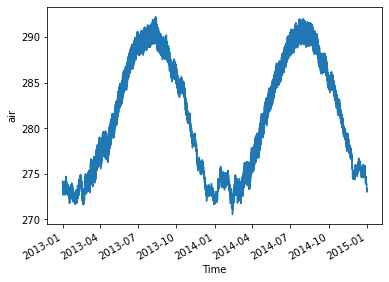

In [52]:
air.mean(dim=["lat", "lon"]).plot()

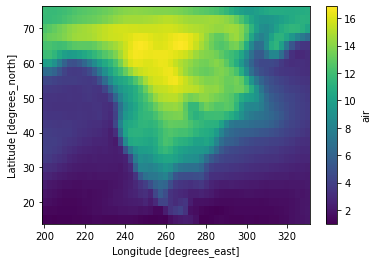

In [61]:
np.std(air,axis=0).plot()

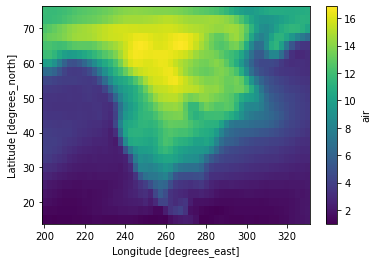

In [55]:
air.std(dim="time").plot()

In [57]:
air.median()

<xarray.DataArray 'air' ()>
array(285.19998, dtype=float32)

Sin embargo, esto no impide que usemos operaciones de `numpy` sobre estructuras de `xarray`

In [62]:
np.mean(air)

<xarray.DataArray 'air' ()>
array(281.25513, dtype=float32)

## 3. Trabajando con datos

### 3.1. Broadcasting y Alignment

Uno de los conceptos importantes al trabajar con arreglos de `numpy` es la propagacion de dimensiones o *broadcasting*.


<div align="center">
<img src="http://scipy-lectures.org/_images/numpy_broadcasting.png" width=50%>
</div>

<a style="font-size: 0.8em" href="http://scipy-lectures.org/intro/numpy/operations.html#broadcasting">Scipy Lecture Notes</a>

In [63]:
a = xr.DataArray(np.arange(3), dims="time", coords={"time": np.arange(3)})
a

<xarray.DataArray (time: 3)>
array([0, 1, 2])
Coordinates:
  * time     (time) int64 0 1 2

In [64]:
b = xr.DataArray(np.arange(4), dims="space", coords={"space": np.arange(4)})
b

<xarray.DataArray (space: 4)>
array([0, 1, 2, 3])
Coordinates:
  * space    (space) int64 0 1 2 3

In [65]:
a + b

<xarray.DataArray (time: 3, space: 4)>
array([[0, 1, 2, 3],
       [1, 2, 3, 4],
       [2, 3, 4, 5]])
Coordinates:
  * time     (time) int64 0 1 2
  * space    (space) int64 0 1 2 3

Por otro lado, la lineacion de coordenadas o *alignment* es una operacion que xarray realiza cuando encuentra coordenadas en comun entre dos o más `DataArray`

<div align="center">
<img src="https://xarray-contrib.github.io/xarray-tutorial/_images/broadcasting.png" width=50%>
</div>

<a style="font-size: 0.8em" href="https://docs.google.com/presentation/d/16CMY3g_OYr6fQplUZIDqVtG-SKZqsG8Ckwoj2oOqepU/edit#slide=id.g67406e8d7_0_135">Imagen de Stephan Hoyer</a>

In [66]:
a = air.sel(time=slice("2013-01-01", "2013-12-31")).isel(lat=0)
a

<xarray.DataArray 'air' (time: 1460, lon: 53)>
array([[241.2    , 242.5    , 243.5    , ..., 232.79999, 235.5    ,
        238.59999],
       [242.09999, 242.7    , 243.09999, ..., 232.     , 233.59999,
        235.79999],
       [242.29999, 242.2    , 242.29999, ..., 234.29999, 236.09999,
        238.7    ],
       ...,
       [251.7    , 251.29999, 250.89   , ..., 238.39   , 238.89   ,
        240.2    ],
       [251.7    , 251.29999, 250.7    , ..., 239.29999, 239.7    ,
        241.     ],
       [251.89   , 251.2    , 250.29999, ..., 239.7    , 239.89   ,
        240.7    ]], dtype=float32)
Coordinates:
    lat      float32 75.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2013-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

In [67]:
b = air.sel(time=slice("2013-10-01", "2014-12-31")).isel(lat=10)
b

<xarray.DataArray 'air' (time: 1828, lon: 53)>
array([[280.79   , 281.     , 281.4    , ..., 285.19998, 287.     ,
        288.5    ],
       [280.69998, 280.6    , 281.1    , ..., 285.4    , 286.9    ,
        288.69998],
       [281.4    , 280.79   , 281.     , ..., 284.69998, 285.9    ,
        287.6    ],
       ...,
       [277.59   , 278.09   , 279.38998, ..., 276.29   , 278.59   ,
        280.29   ],
       [277.59   , 278.29   , 279.09   , ..., 276.29   , 277.79   ,
        279.38998],
       [277.59   , 277.38998, 277.59   , ..., 276.09   , 278.29   ,
        280.38998]], dtype=float32)
Coordinates:
    lat      float32 50.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-10-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

In [74]:
a + b

<xarray.DataArray 'air' (time: 368, lon: 53)>
array([[549.79004, 548.9    , 547.5    , ..., 535.19995, 538.     ,
        541.3    ],
       [549.19995, 548.1    , 547.     , ..., 532.79   , 534.5    ,
        537.8    ],
       [551.9    , 550.58   , 549.29004, ..., 532.58997, 534.19995,
        537.2    ],
       ...,
       [531.99   , 532.69995, 533.49   , ..., 515.39   , 517.39   ,
        520.1    ],
       [531.1    , 531.19995, 531.99   , ..., 517.8    , 518.2    ,
        519.9    ],
       [529.68   , 528.89996, 528.8    , ..., 520.49   , 520.89   ,
        522.2    ]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2013-10-01 ... 2013-12-31T18:00:00
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0

Este tipo de operaciones permite mantener los datos en la coordenada que les corresponde, mantiendo todo siempre en la misma grilla.

### 3.2. Operaciones de alto nivel

Tomado de [xarray in 45 minutes](https://xarray-contrib.github.io/xarray-tutorial/oceanhackweek-2020/xarray-oceanhackweek20.html#High-level-computation:-groupby,-resample,-rolling,-coarsen,-weighted)

`xarray` cuenta con algunos objetos de alto nivel que permiten realizar operaciones comunes

- groupby : Agrupa y reduce datos
- resample : Groupby especializado para ejes de tiempo. Puede aumentar o reducir la resolución temporal.
- rolling : Aplica ventanas moviles sobre los datos e.g. media corrida
- coarsen : Reduce la resolución de los datos
- weighted : Aplica pesos previo a un operación de reducción

`groupby` es altamente útil en la dimensión del tiempo, especialmente para calcular climatologías

In [76]:
air.groupby("time.day")

DataArrayGroupBy, grouped over 'day' 
31 groups with labels 1, 2, 3, 4, 5, 6, ..., 27, 28, 29, 30, 31.

In [77]:
air.groupby("time.month")

DataArrayGroupBy, grouped over 'month' 
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [78]:
air.groupby("time.month").mean()

<xarray.DataArray 'air' (month: 12, lat: 25, lon: 53)>
array([[[246.34987, 246.38608, 246.21518, ..., 243.06113, 244.08795,
         245.6467 ],
        [248.8576 , 248.90733, 248.7104 , ..., 241.52866, 243.50865,
         246.75471],
        [251.57712, 251.19661, 250.71463, ..., 243.39891, 246.78462,
         251.56572],
        ...,
        [295.85028, 295.24405, 295.22684, ..., 295.18625, 294.65707,
         294.0485 ],
        [296.5446 , 296.46982, 296.15994, ..., 295.35593, 295.0812 ,
         294.53006],
        [297.15417, 297.2383 , 297.04892, ..., 296.01797, 295.77554,
         295.63647]],

       [[246.67715, 246.40576, 245.9484 , ..., 241.85838, 243.0021 ,
         244.44383],
        [247.8001 , 247.75992, 247.47757, ..., 240.64706, 242.26633,
         245.06662],
        [249.07079, 248.57234, 247.94254, ..., 242.42874, 245.33348,
         249.72273],
...
        [297.8426 , 297.1406 , 296.98773, ..., 297.96884, 297.56888,
         297.1611 ],
        [298.58783, 298.42026, 297.96896, ..., 298.16412, 298.19397,
         297.9083 ],
        [298.81143, 298.8566 , 298.62103, ..., 298.72955, 298.7519 ,
         298.8189 ]],

       [[247.971  , 248.02118, 247.91302, ..., 239.7719 , 241.02383,
         242.62823],
        [249.73361, 250.16037, 250.48581, ..., 238.78964, 240.96469,
         244.11626],
        [252.0296 , 251.53136, 251.36629, ..., 238.07542, 241.91293,
         247.06987],
        ...,
        [296.76508, 295.97668, 295.88922, ..., 296.45605, 296.09137,
         295.65756],
        [297.46814, 297.38025, 297.04428, ..., 296.8556 , 296.84668,
         296.52133],
        [297.8809 , 297.9868 , 297.77554, ..., 297.60034, 297.5655 ,
         297.53763]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

`resample` nos permite cambiar la frecuencia en la dimensión del tiempo

In [79]:
air.resample(time="1D")

DataArrayResample, grouped over '__resample_dim__' 
730 groups with labels 2013-01-01, ..., 2014-12-31.

In [80]:
air.resample(time="1D").mean()

<xarray.DataArray 'air' (time: 730, lat: 25, lon: 53)>
array([[[241.8725 , 242.3    , 242.67499, ..., 233.3725 , 235.17499,
         237.67499],
        [244.57498, 244.5725 , 244.27501, ..., 231.2475 , 232.825  ,
         236.3    ],
        [254.     , 253.2225 , 251.8225 , ..., 231.475  , 233.69499,
         238.625  ],
        ...,
        [296.3    , 295.975  , 296.     , ..., 295.8975 , 295.32   ,
         294.945  ],
        [296.32498, 296.72498, 296.7425 , ..., 296.17252, 296.     ,
         295.54752],
        [296.62   , 296.995  , 297.1    , ..., 297.0225 , 297.0475 ,
         296.9725 ]],

       [[243.59999, 243.49998, 243.29999, ..., 238.9725 , 240.7975 ,
         243.0725 ],
        [247.8225 , 247.2    , 246.2225 , ..., 235.92499, 236.5975 ,
         238.59999],
        [253.52249, 252.0725 , 250.2975 , ..., 237.69751, 238.8725 ,
         241.9    ],
...
        [296.365  , 295.415  , 295.165  , ..., 296.89   , 296.345  ,
         295.345  ],
        [297.51752, 297.66498, 297.045  , ..., 296.565  , 296.145  ,
         295.41998],
        [298.5675 , 298.7425 , 298.3425 , ..., 296.7925 , 296.34   ,
         295.87   ]],

       [[244.215  , 243.61499, 242.76498, ..., 243.73999, 244.18999,
         244.68999],
        [249.315  , 249.08998, 248.59   , ..., 240.565  , 241.51498,
         243.11499],
        [262.94   , 262.365  , 261.715  , ..., 239.465  , 242.11499,
         246.01498],
        ...,
        [294.84   , 295.14   , 296.63998, ..., 295.415  , 295.165  ,
         294.565  ],
        [296.54   , 297.59   , 298.09003, ..., 295.565  , 295.46497,
         294.78998],
        [297.99   , 298.74   , 298.69   , ..., 296.215  , 295.865  ,
         295.54   ]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2014-12-31
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0

`rolling` permite construir operaciones sobre ventanas móviles

In [81]:
air_ts = air.isel(lat=10, lon=10)
air_ts.rolling(time=30)

DataArrayRolling [time->30]

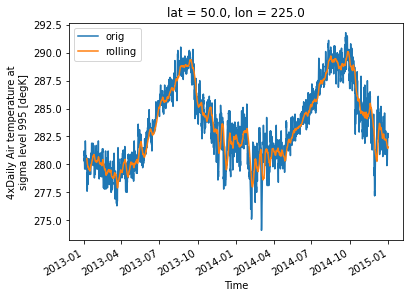

In [82]:
air_ts.plot(label="orig")
air_ts.rolling(time=30).mean().plot(label="rolling")
plt.legend()

### 3.3. Otras operaciones

`xarray` provee muchas operaciones de conveniencia. Siempre es una buena idea revisar la documentación para ver todo lo que tiene por ofrecer. [Link](http://xarray.pydata.org/en/stable/api.html)

In [83]:
air.differentiate("time")

<xarray.DataArray 'air' (time: 2920, lat: 25, lon: 53)>
array([[[ 4.1666384e-14,  9.2591179e-15, -1.8518942e-14, ...,
         -3.7036472e-14, -8.7963382e-14, -1.2962976e-13],
        [-9.2591179e-15, -1.8518942e-14, -2.3148147e-14, ...,
         -8.3332768e-14, -1.2962905e-13, -1.6666624e-13],
        [ 1.4814800e-13,  1.4305609e-13,  1.4861071e-13, ...,
         -1.1111153e-13, -1.3888889e-13, -1.4814800e-13],
        ...,
        [-9.2598243e-15, -1.3888323e-14, -9.2598243e-15, ...,
          0.0000000e+00,  0.0000000e+00,  4.1679099e-15],
        [ 1.3888323e-14,  2.3148147e-14,  0.0000000e+00, ...,
         -1.3888323e-14, -1.8518236e-14, -4.6284993e-15],
        [ 0.0000000e+00,  1.8980238e-14,  1.3888323e-14, ...,
         -2.3148147e-14, -1.8056234e-14,  0.0000000e+00]],

       [[ 2.5462751e-14, -6.9445148e-15, -2.7778059e-14, ...,
          3.4722222e-14,  1.3888676e-14,  2.3149561e-15],
        [ 1.8518588e-14, -2.5463104e-15, -1.6203632e-14, ...,
         -5.7870368e-14, -7.6388602e-14, -8.3333121e-14],
        [ 1.4351809e-13,  1.3194472e-13,  1.2291661e-13, ...,
         -4.6296293e-14, -7.3842645e-14, -8.1018518e-14],
...
        [-2.3148147e-14, -3.7037176e-14, -5.5555414e-14, ...,
         -4.6292057e-15, -6.9441616e-15,  0.0000000e+00],
        [-1.6203986e-14, -2.3148147e-14, -2.5463103e-14, ...,
          4.6299122e-15,  4.6299122e-15,  9.2591179e-15],
        [-1.1574073e-14, -2.5463103e-14, -1.6203986e-14, ...,
          9.2591179e-15,  9.2591179e-15, -2.3149561e-15]],

       [[-3.2407264e-14, -2.3148147e-14, -9.2591179e-15, ...,
         -7.4074353e-14, -1.1574074e-13, -1.3888889e-13],
        [ 0.0000000e+00,  0.0000000e+00, -4.6292057e-15, ...,
         -7.8703557e-14, -1.0185171e-13, -1.2037065e-13],
        [ 2.7778059e-14,  1.8518236e-14,  4.6284993e-15, ...,
         -2.7777353e-14, -2.3148147e-14, -2.7778059e-14],
        ...,
        [ 4.6299122e-15, -9.2584115e-15, -1.3888323e-14, ...,
          9.2598243e-15,  1.8518236e-14,  1.8518236e-14],
        [-9.2598243e-15, -1.3889736e-14, -1.8518236e-14, ...,
          1.8518236e-14,  2.7778059e-14,  3.7037884e-14],
        [-4.6299122e-15, -1.3888323e-14, -1.8518236e-14, ...,
          3.7036472e-14,  3.2407972e-14,  2.3148147e-14]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00

In [84]:
air.integrate("time")

<xarray.DataArray 'air' (lat: 25, lon: 53)>
array([[1.64172108e+19, 1.64050079e+19, 1.63863118e+19, ...,
        1.58143358e+19, 1.58850892e+19, 1.59796561e+19],
       [1.65658517e+19, 1.65696085e+19, 1.65668008e+19, ...,
        1.57475023e+19, 1.58628802e+19, 1.60377523e+19],
       [1.66939550e+19, 1.66661223e+19, 1.66493880e+19, ...,
        1.58012312e+19, 1.59888459e+19, 1.62493678e+19],
       ...,
       [1.87669958e+19, 1.87230696e+19, 1.87026159e+19, ...,
        1.87140791e+19, 1.86811002e+19, 1.86513699e+19],
       [1.87972114e+19, 1.87850774e+19, 1.87556376e+19, ...,
        1.87171361e+19, 1.87119314e+19, 1.86909292e+19],
       [1.88121347e+19, 1.88133605e+19, 1.87962271e+19, ...,
        1.87473066e+19, 1.87437310e+19, 1.87452306e+19]])
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0

In [87]:
air.isel(lat=10, lon=10).polyfit("time", deg=4)

<xarray.Dataset>
Dimensions:               (degree: 5)
Coordinates:
  * degree                (degree) int64 4 3 2 1 0
Data variables:
    polyfit_coefficients  (degree) float64 -1.719e-65 9.56e-47 ... -6.419e+07

In [86]:
# xr.polyval()

## 4. Gráficos

Para una descripción más detallada, revisar https://xarray.pydata.org/en/stable/plotting.html

`xarray` permite realizar plots simples de nuestros datos usando el método `.plot`

(array([   2182.,   60537.,  195026.,  233763.,  315219.,  635948.,
         778807., 1192236.,  453381.,    1901.]),
 array([221.     , 230.64   , 240.28   , 249.92   , 259.56   , 269.2    ,
        278.84   , 288.47998, 298.12   , 307.76   , 317.4    ],
       dtype=float32),
 <BarContainer object of 10 artists>)

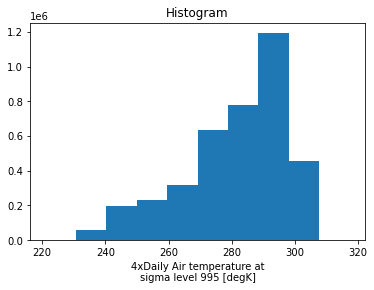

In [88]:
air.plot()

Es posible hacer una grilla de gráficos especificando algunos parámetros

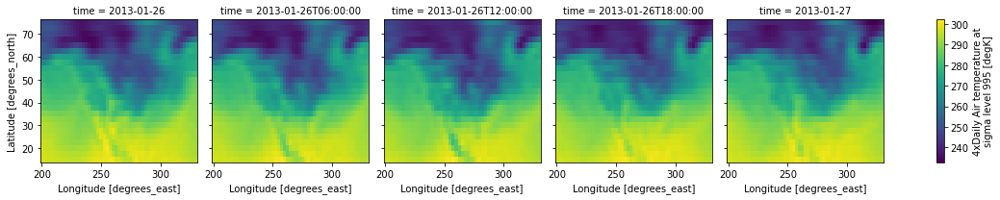

In [90]:
air.isel(time=slice(100, 105)).plot(col="time")

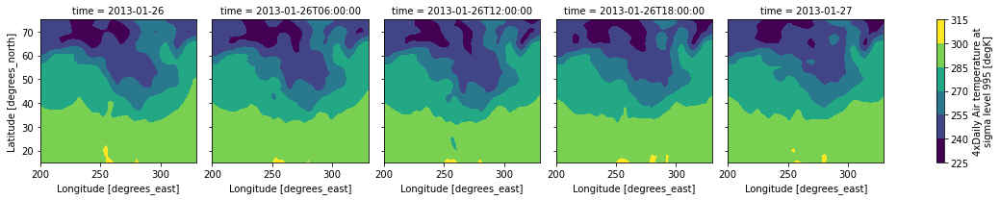

In [91]:
air.isel(time=slice(100, 105)).plot.contourf(col="time")

## 5. Integración con dask

`xarray` tiene la capacidad de leer multiples archivos netcdf dentro de un solo objeto mediante la función `open_mfdataset`. Ya que no contamos con una gran cantidad de datos por el momento, vamos a simular este procedimiento aplicando `chunks` a nuestros datos de temperatura

In [92]:
air_dask = air.chunk(dict(time=4))
air_dask

<xarray.DataArray 'air' (time: 2920, lat: 25, lon: 53)>
dask.array<xarray-<this-array>, shape=(2920, 25, 53), dtype=float32, chunksize=(4, 25, 53), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00
Attributes:
    long_name:     4xDaily Air temperature at sigma level 995
    units:         degK
    precision:     2
    GRIB_id:       11
    GRIB_name:     TMP
    var_desc:      Air temperature
    dataset:       NMC Reanalysis
    level_desc:    Surface
    statistic:     Individual Obs
    parent_stat:   Other
    actual_range:  [185.16 322.1 ]

Las operaciones a realizar sobre esta nueva variable seran evaluadas de manera "vaga" (*lazy*), esto quiere decir que ninguna operación será realizada hasta que se llame `compute` o `load`

In [93]:
air_dask.mean(dim="lat")

<xarray.DataArray 'air' (time: 2920, lon: 53)>
dask.array<mean_agg-aggregate, shape=(2920, 53), dtype=float32, chunksize=(4, 53), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * time     (time) datetime64[ns] 2013-01-01 ... 2014-12-31T18:00:00

In [96]:
air_dask.groupby("time.month").mean(dim="time")

<xarray.DataArray 'air' (month: 12, lat: 25, lon: 53)>
dask.array<stack, shape=(12, 25, 53), dtype=float32, chunksize=(1, 25, 53), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 75.0 72.5 70.0 67.5 65.0 ... 25.0 22.5 20.0 17.5 15.0
  * lon      (lon) float32 200.0 202.5 205.0 207.5 ... 322.5 325.0 327.5 330.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

## 6. Aplicación con datos reales

Para cargar datos en formato netcdf a una variable, se hacer uso de la función open_dataset (en el caso de tener 1 solo archivo) o open_mfdataset en caso de tener muchos archivos. Es este caso vamos a leer datos de temperatura superficial del mar de ERSSTv5 para hacer el cálculo del Oceanic Niño Index (ONI).

In [97]:
ersstv5 = xr.open_dataset(
    "https://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/noaa.ersst.v5/sst.mnmean.nc"
)
ersstv5

<xarray.Dataset>
Dimensions:    (lat: 89, lon: 180, nbnds: 2, time: 2006)
Coordinates:
  * lat        (lat) float32 88.0 86.0 84.0 82.0 ... -82.0 -84.0 -86.0 -88.0
  * lon        (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time       (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-02-01
Dimensions without coordinates: nbnds
Data variables:
    time_bnds  (time, nbnds) float64 ...
    sst        (time, lat, lon) float32 ...
Attributes: (12/38)
    climatology:                     Climatology is based on 1971-2000 SST, X...
    description:                     In situ data: ICOADS2.5 before 2007 and ...
    keywords_vocabulary:             NASA Global Change Master Directory (GCM...
    keywords:                        Earth Science > Oceans > Ocean Temperatu...
    instrument:                      Conventional thermometers
    source_comment:                  SSTs were observed by conventional therm...
    ...                              ...
    license:                         No constraints on data access or use
    comment:                         SSTs were observed by conventional therm...
    summary:                         ERSST.v5 is developed based on v4 after ...
    dataset_title:                   NOAA Extended Reconstructed SST V5
    data_modified:                   2021-04-03
    DODS_EXTRA.Unlimited_Dimension:  time

### Calculo del ONI

El ONI esta definido como la media corrida de 3 meses sobre el indice del Niño 3.4 (5°S-5°N / 170°W-120°W)

In [101]:
nino34 = ersstv5.sst.sel(lat=slice(5, -5), lon=slice(190, 240))
nino34

<xarray.DataArray 'sst' (time: 2006, lat: 5, lon: 26)>
[260780 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 4.0 2.0 0.0 -2.0 -4.0
  * lon      (lon) float32 190.0 192.0 194.0 196.0 ... 234.0 236.0 238.0 240.0
  * time     (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-02-01
Attributes:
    long_name:     Monthly Means of Sea Surface Temperature
    units:         degC
    var_desc:      Sea Surface Temperature
    level_desc:    Surface
    statistic:     Mean
    dataset:       NOAA Extended Reconstructed SST V5
    parent_stat:   Individual Values
    actual_range:  [-1.8     42.32636]
    valid_range:   [-1.8 45. ]
    _ChunkSizes:   [  1  89 180]

In [102]:
nino34 = nino34.mean(dim=["lat", "lon"])
nino34

<xarray.DataArray 'sst' (time: 2006)>
array([25.897709, 26.05581 , 26.908752, ..., 25.449331, 25.556704,
       25.723946], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-02-01

#### Cálculo de la climatología

Para realizar este cálculo, vamos a tomar como periodo base 1986-2015 con fines ilustrativos. En el cálculo actual, el periodo de la climatología cambia cada 5 años segun los criterios considerados por el centro de predicción del clima de la NOAA ([ref](https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_change.shtml))

In [103]:
nino34_clim = (
    nino34.sel(time=slice("1986-01-01", "2015-12-31"))
    .groupby("time.month")
    .mean(dim="time")
)
nino34_clim

<xarray.DataArray 'sst' (month: 12)>
array([26.45282 , 26.663277, 27.207197, 27.733192, 27.846169, 27.652773,
       27.258688, 26.906843, 26.797222, 26.754303, 26.74884 , 26.652887],
      dtype=float32)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

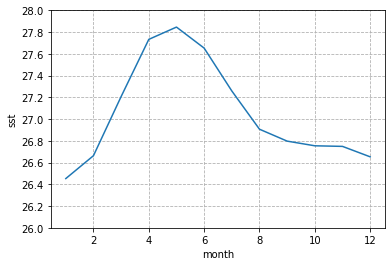

In [104]:
fig, ax = plt.subplots()
nino34_clim.plot(ax=ax)
ax.set_yticks(np.arange(26, 28.1, 0.2))
ax.set_ylim(26, 28)
ax.grid(ls="--")

#### Cálculo de la anomalía

Utilizaremos una sintaxis similar para restar las climatologías a los valores absolutos

In [105]:
nino34_anom = nino34.groupby("time.month") - nino34_clim
nino34_anom

<xarray.DataArray 'sst' (time: 2006)>
array([-0.55511093, -0.60746574, -0.29844475, ..., -1.2035561 ,
       -0.89611626, -0.93933105], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-02-01
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 4 5 6 7 8 9 10 11 12 1 2

In [106]:
ONI = nino34_anom.rolling(time=3, center=True).mean()

# truncamos los valores al segundo decimal
ONI = np.around(ONI, decimals=2)
ONI

<xarray.DataArray 'sst' (time: 2006)>
array([  nan, -0.49, -0.34, ..., -1.19, -1.01,   nan])
Coordinates:
  * time     (time) datetime64[ns] 1854-01-01 1854-02-01 ... 2021-02-01
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 4 5 6 7 8 9 10 11 12 1 2

In [107]:
ONI.attrs["long_name"] = "SST Anomaly"
ONI.attrs["units"] = "degrees C"

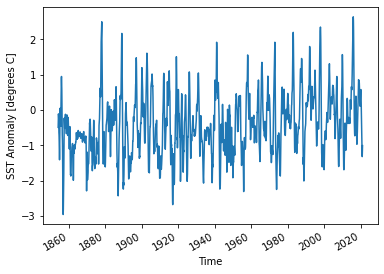

In [108]:
ONI.plot()

Con algo de tiempo, podemos hacer un gráfico un poco más atractivo

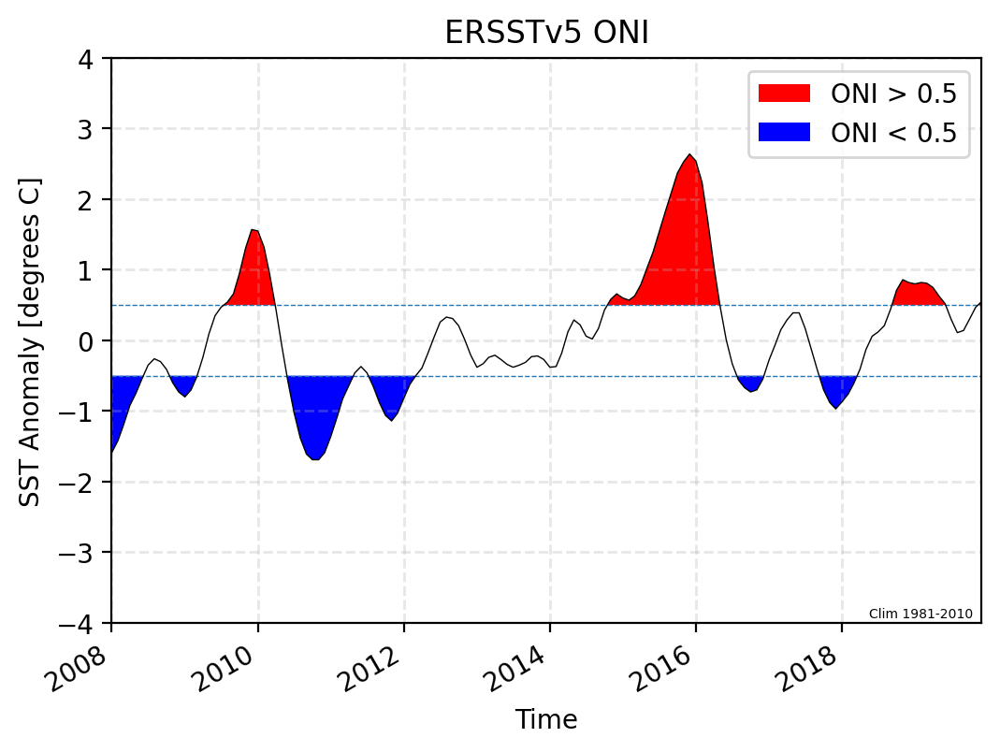

In [109]:
# Colocamos el tiempo que queremos plotear
plot_data = ONI.sel(time=slice("2008-01-01", "2019-12-31"))

# Declaramos la figura y los ejes
fig, ax = plt.subplots(dpi=200)

ax.fill_between(
    plot_data.time.data,
    plot_data.data,
    0.5,
    where=plot_data > 0.5,
    color="red",
    interpolate=True,
    lw=0,
    label="ONI > 0.5",
)
ax.fill_between(
    plot_data.time.data,
    plot_data.data,
    -0.5,
    where=plot_data < -0.5,
    color="blue",
    interpolate=True,
    lw=0,
    label="ONI < 0.5",
)
plot_data.plot(ax=ax, c="k", lw=0.5)

minx = plot_data.time.min().data
maxx = plot_data.time.max().data
ax.hlines(0.5, minx, maxx, lw=0.5, linestyles="--")
ax.hlines(-0.5, minx, maxx, lw=0.5, linestyles="--")

ax.set_ylim(-4, 4)
ax.set_xlim(minx, maxx)

ax.text(
    0.99,
    0.01,
    "Clim 1981-2010",
    fontsize=5,
    horizontalalignment="right",
    transform=ax.transAxes,
)

ax.set_title("ERSSTv5 ONI")
ax.grid(ls="--", lw=1, alpha=0.3)
ax.legend()

## 7. Aplicación Numérica

*Tomado de un ejercicio del curso "Modelado Numérico de la Atmósfera" organizado por el IGP [[Repo]](https://github.com/DangoMelon/cmna-igp)*

Dada la siguiente malla de datos de temperatura, pronosticar la evolución del campo de la variable para una hora. Aplicar el método de Euler para las derivadas zonal y meridional.

### Datos
* Velocidad del viento = CONST = 7m/s
* Dirección del viento = CONST = 140°
* Resolución del dominio dx = dy = 18km
* Paso del tiempo -> por determinar

$$
TEMP = \begin{bmatrix}
21.2 & 22.8 & 23.5 & 24.8 & 26.5 \\
22.7 & 24.4 & 25.2 & 26.5 & 28.4 \\
24.3 & 26.1 & 27.0 & 28.4 & 30.4 \\
26.0 & 27.9 & 28.9 & 30.4 & 32.5 \\
27.8 & 29.9 & 30.9 & 32.5 & 34.8 \\
29.7 & 32.0 & 33.0 & 34.8 & 37.2 \\
31.8 & 34.2 & 35.3 & 37.2 & 39.8
\end{bmatrix}$$

---

## Solución

La ecuación que estamos tratando de resolver es la siguiente:

$$
\frac{\partial T }{\partial t} + u \frac{\partial T}{\partial x} + v \frac{\partial T}{\partial y} = 0
$$

En donde el paso de tiempo estara determinado por el numero de Courant

$$
\frac{\lvert u\rvert*\Delta t}{\Delta x} + \frac{\lvert v\rvert*\Delta t}{\Delta y} \leq 0.06
\\
$$

Que resulta en

$$
\Delta t \leq \frac{0.06}{\left(\frac{\lvert u\rvert}{\Delta x} + \frac{\lvert v\rvert}{\Delta y}\right)}
$$

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
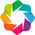

In [110]:
# Graficos interactivos
import holoviews as hv
import panel as pn
from panel.interact import fixed, interact

pn.extension()
hv.extension("bokeh")

In [111]:
# Declaración de datos
dx = dy = 18
magw = 7
angw = 140
temp_arr = np.array(
    [
        [21.2, 22.8, 23.5, 24.8, 26.5],
        [22.7, 24.4, 25.2, 26.5, 28.4],
        [24.3, 26.1, 27.0, 28.4, 30.4],
        [26.0, 27.9, 28.9, 30.4, 32.5],
        [27.8, 29.9, 30.9, 32.5, 34.8],
        [29.7, 32.0, 33.0, 34.8, 37.2],
        [31.8, 34.2, 35.3, 37.2, 39.8],
    ]
)

In [112]:
# Calculo de las componentes u,v
u = magw * np.cos(np.deg2rad(140))
v = magw * np.sin(np.deg2rad(140))

print(f"u = {u}\n v = {v}")

u = -5.362311101832845
 v = 4.499513267805776


Con los valores obtenidos para u y v, calculamos el valor límite que debe tener $\Delta t$

In [113]:
dt_approx = 0.06 / ((np.abs(u) / (dx * 1000)) + (np.abs(v) / (dy * 1000)))
print(f"dt_approx = {dt_approx}")

dt_approx = 109.5132056219711


Entonces tomamos

$$
\Delta t \approx 100s
$$

Construimos una grilla que cumpla con $\Delta x$ y $\Delta y$ (no es necesario realizar esto, pero es util para tener coordenadas definidas dentro de xarray)

In [114]:
lon = np.arange(-90, -90 + temp_arr.shape[1] * dx, dx)
lat = np.arange(-50, -50 + temp_arr.shape[0] * dy, dy)
print(f"lon = {lon}\nlat = {lat}")

lon = [-90 -72 -54 -36 -18]
lat = [-50 -32 -14   4  22  40  58]


Construimos nuestra matriz de datos con `lat` y `lon` como coordenadas

In [115]:
temp = xr.DataArray(temp_arr, coords=[("lat", lat[::-1]), ("lon", lon)])

# Metadata adicional para variables/coordenadas que sigue la convención CF
temp.lon.attrs["long_name"] = "Longitude"
temp.lon.attrs["units"] = "degrees_east"
temp.lat.attrs["long_name"] = "Latitude"
temp.lat.attrs["units"] = "degrees_north"
temp.attrs["long_name"] = "Temperature"
temp.attrs["units"] = "degrees_C"
temp.name = "temperature"

temp

<xarray.DataArray 'temperature' (lat: 7, lon: 5)>
array([[21.2, 22.8, 23.5, 24.8, 26.5],
       [22.7, 24.4, 25.2, 26.5, 28.4],
       [24.3, 26.1, 27. , 28.4, 30.4],
       [26. , 27.9, 28.9, 30.4, 32.5],
       [27.8, 29.9, 30.9, 32.5, 34.8],
       [29.7, 32. , 33. , 34.8, 37.2],
       [31.8, 34.2, 35.3, 37.2, 39.8]])
Coordinates:
  * lat      (lat) int64 58 40 22 4 -14 -32 -50
  * lon      (lon) int64 -90 -72 -54 -36 -18
Attributes:
    long_name:  Temperature
    units:      degrees_C

In [116]:
# Arreglos para grafico de quivers
u_arr = np.full_like(temp_arr, u)
v_arr = np.full_like(temp_arr, v)

Se puede explorar nuestra malla de datos iniciales

Text(0.5, 1.0, 'En grilla')

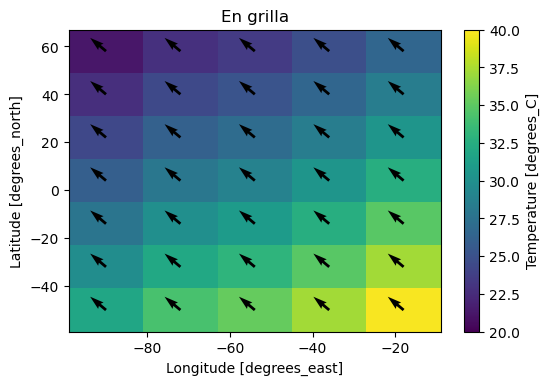

In [117]:
fig, ax = plt.subplots(dpi=100)
temp.plot(ax=ax, vmin=20, vmax=40)
ax.quiver(lon, lat, u_arr, v_arr)
ax.set_title("En grilla")

Text(0.5, 1.0, 'En contornos')

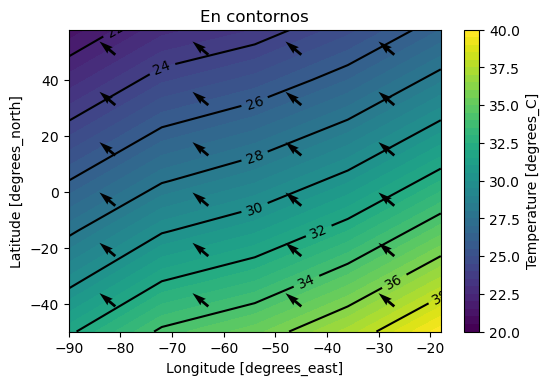

In [118]:
levels = np.arange(20, 40.5, 0.5)

fix, ax = plt.subplots(dpi=100)
temp.plot.contourf(ax=ax, vmin=20, vmax=40, levels=levels)
CS = temp.plot.contour(ax=ax, vmin=20, vmax=40, colors="k", levels=levels[::4])
ax.quiver(lon + dx / 2, lat + dy / 2, u_arr, v_arr)
ax.set_ylim(lat.min(), lat.max())
ax.set_xlim(lon.min(), lon.max())
ax.clabel(CS, colors="k", fmt="%i")
ax.set_title("En contornos")

---

La discretización de la ecuacion a resolver se hara con un esquema centrado en el espacio y adelantado en el tiempo

$$
\left(\frac{T_{i,j}^{n+1} - T_{i,j}^{n}}{\Delta t}\right) + u \left(\frac{T_{i+1,j}^{n} - T_{i-1,j}^{n}}{2\Delta x} \right) + v \left( \frac{T_{i,j+1}^{n} - T_{i,j-1}^{n}}{2\Delta y} \right) = 0
$$

De donde

$$
T_{i,j}^{n+1} = \Delta t \ T_{i,j}^{n} - \frac{u \Delta t}{2 \Delta x} \left( T_{i+1,j}^{n} - T_{i-1,j}^{n} \right) - \frac{v \Delta t}{2 \Delta y} \left( T_{i,j+1}^{n} - T_{i,j-1}^{n} \right)
$$

Implementamos la discretizacion obtenida en una función que nos permitirá obtener la temperatura pronosticada

In [119]:
def solve(
    inarr,
    dt,
    u,
    v,
    nt,
    boundary="1st_order",
    tstart="2021-04-03T00:00",
    plot=False,
    dynamic=False,
    **hv_kwargs,
):
    """
    Resuelve la ecuacion de momento en dos dimensiones con velocidades constantes

    Parametros
    ----------
    inarr: DataArray
        Objeto de xarray con grilla regular (lat, lon) que
        representa el campo inicial
    dt: int
        Salto de tiempo
    u: float
        Valor de la velocidad zonal
    v: float
        Valor de la velocidad meridional
    nt: int
        Saltos de tiempo a resolver
    boundary: {'1st_order', '2nd_order', 'constant'}
        Condicion de frontera a usar.
        Por defecto se usa '1st_order'
        Puede ser una de las siguientes opciones:
            -'1st_order': aproximacion de primer orden hacia
                adelante/atras en los bordes
            -'2nd_order': aproximacion de segundo orden hacia
                adelante/atras en los bordes
            -'constant': frontera constante, i.e dT/dr = 0
    tstart: string, opcional
        Fecha inicial de la simulación. Útil para la dimension
        tiempo a agregar en el array de salida.
        Por defecto toma el valor 2021-04-03T00:00

    Retorna
    -------
    outarr: DataArray
        Arreglo con las mismas coordenadas que inarr pero con
        la dimension `time` agregada, de longitud `nt`+1 y
        saltos `dt`.
    """

    boundaries = {"1st_order": 1, "2nd_order": 2}
    diff_kwargs = {}

    tdelta = pd.Timedelta(dt, unit="s")
    tstart = pd.to_datetime(tstart)
    outarr = xr.DataArray(
        np.nan,
        coords=[
            ("time", pd.date_range(tstart, tstart + (tdelta * nt), freq=f"{dt}s")),
            ("lat", inarr.lat),
            ("lon", inarr.lon),
        ],
    )
    outarr[0] = inarr

    const = 1
    if boundary in boundaries.keys():
        diff_kwargs = dict(edge_order=boundaries[boundary])
    elif boundary == "constant":
        const = xr.zeros_like(inarr)
        const[1:-1, 1:-1] = 1

    for i in range(outarr.time.size - 1):
        current_time = outarr.isel(time=i)
        cdiffx = current_time.differentiate("lon", **diff_kwargs) * const / 1000
        cdiffy = current_time.differentiate("lat", **diff_kwargs) * const / 1000
        outarr[i + 1] = (current_time) - (u * dt * cdiffx) - (v * dt * cdiffy)

    # Colocamos la metadata
    outarr["boundary"] = boundary
    outarr = outarr.expand_dims("boundary")
    outarr.lat.attrs = inarr.lat.attrs
    outarr.lon.attrs = inarr.lon.attrs
    outarr.time.attrs["long_name"] = "Time"
    outarr.boundary.attrs["long_name"] = "Boundary Condition"
    outarr.attrs = inarr.attrs
    outarr.name = "forecast_temp"

    # En caso de querer retornar el gráfico
    if plot:
        hmap = hv.Dataset(outarr).to(hv.Image, kdims=["lon", "lat"])
        cont = hv.operation.contours(
            hmap, filled=True, dynamic=dynamic, levels=np.arange(-5, 60, 1.0).tolist()
        ).redim.range(forecast_temp=(20, 40))
        xx, yy = np.meshgrid(
            np.linspace(lon.min(), lon.max(), 30), np.linspace(lat.min(), lat.max(), 30)
        )
        vector = hv.VectorField(
            (
                xx,
                yy,
                np.full_like(xx, np.arctan2(v, u)),
                np.full_like(xx, 1),
            )
        )
        layout = cont * vector
        layout.opts(
            hv.opts.Polygons(
                tools=["hover", "save"],
                default_tools=[],
                ylim=(lat.min(), lat.max()),
                xlim=(lon.min(), lon.max()),
                frame_width=500,
                aspect="equal",
                colorbar=True,
                color_levels=22,
            ),
            hv.opts.Overlay(default_tools=[]),
            hv.opts.VectorField(default_tools=[]),
        )
        if dynamic:
            pan = pn.panel(layout, widget_type="scrubber", widget_location="bottom")
            # Modificamos la velocidad de reproducción por defecto
            player = pan[1][1][0]
            player.param.interval.default = 150
            return pan
        return layout

    return outarr

In [120]:
fore_temp = solve(temp, 100, u, v, 36, boundary="2nd_order")
fore_temp

<xarray.DataArray 'forecast_temp' (boundary: 1, time: 37, lat: 7, lon: 5)>
array([[[[21.2       , 22.8       , 23.5       , 24.8       ,
          26.5       ],
         [22.7       , 24.4       , 25.2       , 26.5       ,
          28.4       ],
         [24.3       , 26.1       , 27.        , 28.4       ,
          30.4       ],
         ...,
         [27.8       , 29.9       , 30.9       , 32.5       ,
          34.8       ],
         [29.7       , 32.        , 33.        , 34.8       ,
          37.2       ],
         [31.8       , 34.2       , 35.3       , 37.2       ,
          39.8       ]],

        [[21.29731684, 22.87300502, 23.57103616, 24.8846816 ,
          26.60284717],
         [22.80279564, 24.47848381, 25.27502542, 26.59266012,
          28.51428408],
         [24.40827443, 26.1839626 , 27.08050421, 28.49938878,
          30.51976288],
...
         [31.73613608, 33.20385475, 34.39877513, 37.04114745,
          40.11106847],
         [33.91612521, 35.48472149, 36.78425557, 39.59399027,
          42.69366243],
         [36.22056315, 37.91153891, 39.39971594, 42.36591525,
          46.3155371 ]],

        [[24.2705832 , 25.38484985, 26.33159533, 28.36039193,
          30.81473594],
         [25.97014853, 27.17966159, 28.21778502, 30.36270819,
          33.0444578 ],
         [27.77670772, 29.08689393, 30.22308767, 32.47275223,
          35.16284895],
         ...,
         [31.83755781, 33.29926149, 34.51316198, 37.18876629,
          40.27438283],
         [34.0229117 , 35.58628286, 36.90796939, 39.74856511,
          42.86786976],
         [36.33311927, 38.02138143, 39.53431913, 42.5409574 ,
          46.55137383]]]])
Coordinates:
  * time      (time) datetime64[ns] 2021-04-03 ... 2021-04-03T01:00:00
  * lat       (lat) int64 58 40 22 4 -14 -32 -50
  * lon       (lon) int64 -90 -72 -54 -36 -18
  * boundary  (boundary) <U9 '2nd_order'
Attributes:
    long_name:  Temperature
    units:      degrees_C

Exploramos el resultado para condiciones de frontera con solución de segundo orden y constante

In [121]:
fcst_2nd = solve(temp, 100, u, v, 36, plot=True, boundary="2nd_order")
fcst_2nd

:HoloMap   [time,boundary]
   :Overlay
      .Polygons.I    :Polygons   [lon,lat]   (forecast_temp)
      .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)

In [122]:
fcst_const = solve(temp, 100, u, v, 36, plot=True, boundary="constant")
fcst_const

:HoloMap   [time,boundary]
   :Overlay
      .Polygons.I    :Polygons   [lon,lat]   (forecast_temp)
      .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)

---

## Live Demo

Row
    [0] HSpacer()
    [1] Column(margin=20)
        [0] PNG(str, align='center', margin=-25, width=250)
        [1] Markdown(str, margin=0)
        [2] Column
            [0] IntSlider(end=110, name='dt', start=10, step=10, value=100)
            [1] FloatSlider(end=15, name='u', start=-15, value=-5.399999999999999)
            [2] FloatSlider(end=15, name='v', start=-15, value=4.400000000000002)
            [3] IntSlider(end=180, name='nt', start=18, step=18, value=36)
            [4] Select(name='boundary', options=['1st_order', ...], value='1st_order')
        [3] VSpacer()
        [4] Markdown(str)
    [2] Row
        [0] Column
            [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
            [1] Row
                [0] HSpacer()
                [1] WidgetBox
                    [0] Player(end=36, width=550)
                [2] HSpacer()
    [3] HSpacer()
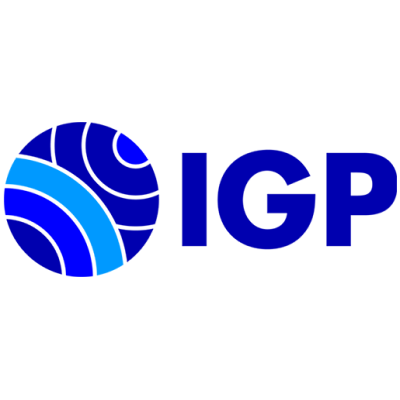

In [123]:
live_panel = interact(
    solve,
    inarr=fixed(temp),
    dt=(10, 110, 10, 100),
    u=(-15, 15, 0.1, u),
    v=(-15, 15, 0.1, v),
    nt=(18, 36 * 5, 18, 36),
    plot=fixed(True),
    boundary=["1st_order", "2nd_order", "constant"],
    dynamic=fixed(True),
)

pn.Row(
    pn.layout.HSpacer(),
    pn.Column(
        pn.pane.PNG(
            "https://repositorio.igp.gob.pe/themes/Mirage/images/logo_igp_sharecontent.png",
            align="center",
            width=250,
            margin=-25,
        ),
        pn.pane.Markdown("## Difusión de la Temperatura\n **Parámetros**", margin=0),
        live_panel[0],
        pn.layout.VSpacer(),
        pn.pane.Markdown("*Club de Python para Físicos*"),
        margin=20,
    ),
    live_panel[1],
    pn.layout.HSpacer(),
)


## 8. Recursos útiles

* [xarray Tutorial](https://xarray-contrib.github.io/xarray-tutorial/index.html)
* [Pangeo](https://pangeo.io/)
* [Scipy Lecture Notes](http://scipy-lectures.org/index.html)
* ["Scaling Scientific Python"](https://matthewrocklin.com/slides/ams-2018.html#/) por Matthew Rocklin
* [Documentación](http://xarray.pydata.org/en/stable/index.html) oficial de xarray
* ["multi-dimensional data analysis in Python"](https://fabienmaussion.info/acinn_xarray_workshop/#/) por Fabien Maussion
* [An Introduction to Earth and Environmental Data Science](https://earth-env-data-science.github.io/intro)
## Donaciones
<br>
<center>
Puedes donar una vez en el siguiente enlace (Ko-Fi):

<br>
    
*Click en la imagen.*

<a href="https://ko-fi.com/rcrdphysics">
<img src="https://habrastorage.org/webt/8r/ml/xf/8rmlxfpdzukegpxa62cxlfvgkqe.png" width=20% />

</center>